<a href="https://colab.research.google.com/github/nagamamo/international_finance/blob/main/9_timeseries_analysis_and_exchange_rate_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

9　Prophetを用いた為替レートの予測

9.1　Prophetによる為替レートの予測

　以下では、Prophetを用いた為替レートの予測例を紹介します。ライブラリは、まず数値計算用のpandas、データ取得を目的とするpandas datareader、標本期間を指定するためのdatetime、時系列モデルにベイズ統計を用いるためのstan、そして時系列モデル用のprophet、最後に図表用のライブラリであるmatplotlibを読み込みます。Prophetではベイズ統計を用いることで、新たな情報（データ）が加わる度に、予測時の確率分布を変化させます。

In [ ]:
#[1]ライブラリ読み込み
import pandas as pd
import pandas_datareader as data
import datetime
from prophet import Prophet #時系列モデル用ライブラリ
import matplotlib.pyplot as plt

9.2　為替レート日次データの取得

　続いて為替レートのヒストリカル・データを取得します。今回はpandas_datareaderを用いる際に（）内に直接証券コードを書き込むため、冒頭にティッカーコードは指定しません。

In [ ]:
#[2]データ取得
tickers=['DEXJPUS']#為替レートを米セントルイス連銀から取得
start=datetime.date(1973,1,1)#標本期間を2019年1月1日から
end=datetime.date(2023,12,31)#2023年12月31日までに指定
USDJPY=data.DataReader(tickers,'fred',start=start,end=end)#データの取得
USDJPY.head()

,DEXJPUS
DATE,
1973-01-01,NaN
1973-01-02,301.39
1973-01-03,301.43
1973-01-04,301.20
1973-01-05,301.30


9.3　変数名のリセットと再定義

　　Prophetでは変数名を日時＝'ds'、予測する変数＝'y'に指定されています。このため一度、データフレームのインデックス名を一度リセットして日時をdsへ、予測したい変数をｙへ変数名を変更します。

In [ ]:
#[3]データフレームの整理
USDJPY.reset_index(inplace=True) #prophetの変数定義への変更するためリセット
USDJPY = USDJPY.rename(columns={'DATE': 'ds','DEXJPUS': 'y'}) #prophetの変数定義への変更

9.4　2024年12月29日のドル円レート予測

　最後のセルでは、一行目で時系列モデルにProphetを使用する指示を与えます。二行目においてヒストリカル・データをフィッティングし、三行目で予測期間を指定します。これらを実施した後、予測結果を保存し、可視化します。

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpb5x2z99k/m2_bywt6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpb5x2z99k/18j0b6ie.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=64883', 'data', 'file=/tmp/tmpb5x2z99k/m2_bywt6.json', 'init=/tmp/tmpb5x2z99k/18j0b6ie.json', 'output', 'file=/tmp/tmpb5x2z99k/prophet_modelvbv6uvvm/prophet_model-20240119115620.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:56:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
11:56:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


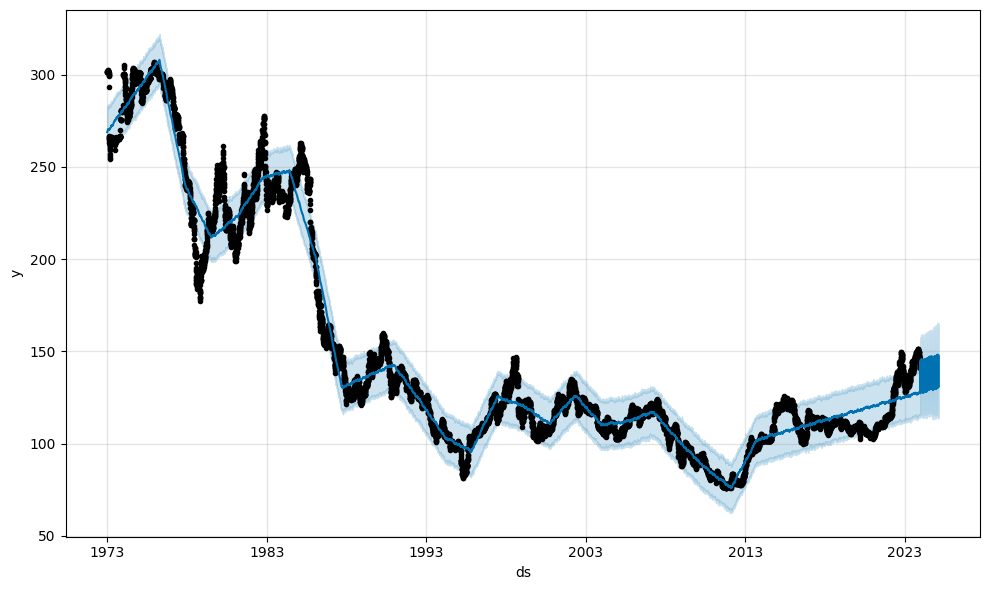

In [ ]:
#[4]2024年12月29日のドル円レートの予測
model = Prophet() #時系列モデルにprophetを採用：モデル名をmodel
model.fit(USDJPY) #データを時系列モデルにフィッティング
future = model.make_future_dataframe(periods=414,freq="d") #予測の期間と頻度の定義
forecast = model.predict(future)#予測結果の保存
model.plot(forecast)#可視化
plt.show()

9.5　予測結果の確認

尚、予測結果の各データは下記により取得、保存できます。

In [ ]:
#[5]予測結果のデータ確認
pd.set_option("display.max_rows", len(forecast))
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1973-01-02,273.982039,255.736931,282.327721,273.982039,273.982039,-5.154331,-5.154331,-5.154331,-4.972467,-4.972467,-4.972467,-0.181864,-0.181864,-0.181864,0.0,0.0,0.0,268.827708
1,1973-01-03,274.014770,256.431744,282.266309,274.014770,274.014770,-5.068126,-5.068126,-5.068126,-4.930490,-4.930490,-4.930490,-0.137636,-0.137636,-0.137636,0.0,0.0,0.0,268.946644
2,1973-01-04,274.047501,255.387936,282.223071,274.047501,274.047501,-5.032379,-5.032379,-5.032379,-4.941161,-4.941161,-4.941161,-0.091218,-0.091218,-0.091218,0.0,0.0,0.0,269.015122
3,1973-01-05,274.080232,257.048635,282.604908,274.080232,274.080232,-4.919927,-4.919927,-4.919927,-4.876757,-4.876757,-4.876757,-0.043170,-0.043170,-0.043170,0.0,0.0,0.0,269.160305
4,1973-01-08,274.178426,256.044237,281.390806,274.178426,274.178426,-4.757801,-4.757801,-4.757801,-4.862707,-4.862707,-4.862707,0.104905,0.104905,0.104905,0.0,0.0,0.0,269.420624
5,1973-01-09,274.211157,255.749067,282.775173,274.211157,274.211157,-4.818860,-4.818860,-4.818860,-4.972467,-4.972467,-4.972467,0.153607,0.153607,0.153607,0.0,0.0,0.0,269.392297
6,1973-01-10,274.243888,256.468929,282.196221,274.243888,274.243888,-4.729469,-4.729469,-4.729469,-4.930490,-4.930490,-4.930490,0.201020,0.201020,0.201020,0.0,0.0,0.0,269.514419
7,1973-01-11,274.276619,255.349237,281.881730,274.276619,274.276619,-4.694559,-4.694559,-4.694559,-4.941161,-4.941161,-4.941161,0.246602,0.246602,0.246602,0.0,0.0,0.0,269.582060
8,1973-01-12,274.309351,257.125994,282.032500,274.309351,274.309351,-4.586917,-4.586917,-4.586917,-4.876757,-4.876757,-4.876757,0.289840,0.289840,0.289840,0.0,0.0,0.0,269.722433
9,1973-01-15,274.407544,256.509405,283.170985,274.407544,274.407544,-4.461706,-4.461706,-4.461706,-4.862707,-4.862707,-4.862707,0.401000,0.401000,0.401000,0.0,0.0,0.0,269.945838
